In [1]:
!pip install -q tensorflow-gpu==2.0.0-rc1

     |████████████████████████████████| 380.5MB 39kB/s 
     |████████████████████████████████| 4.3MB 62.2MB/s 
     |████████████████████████████████| 501kB 57.9MB/s 


In [2]:
!pip install tf-nightly-gpu

     |████████████████████████████████| 526.2MB 31kB/s 
     |████████████████████████████████| 3.0MB 50.3MB/s 
ERROR: tensorflow-gpu 2.0.0rc1 has requirement tb-nightly<1.15.0a20190807,>=1.15.0a20190806, but you'll have tb-nightly 2.3.0a20200607 which is incompatible.
  Found existing installation: tb-nightly 1.15.0a20190806
    Uninstalling tb-nightly-1.15.0a20190806:
      Successfully uninstalled tb-nightly-1.15.0a20190806


In [3]:
!pip install import_ipynb

  Created wheel for import-ipynb: filename=import_ipynb-0.1.3-cp36-none-any.whl size=2976 sha256=3acffdb96cb47a5af61da4f62ad430989c2c4b6b99049382d55ecd6812d222d2
  Stored in directory: /root/.cache/pip/wheels/b4/7b/e9/a3a6e496115dffdb4e3085d0ae39ffe8a814eacc44bbf494b5
Successfully built import-ipynb


In [4]:
#ipynb 모듈 불러오기 위한 설정(model import)
import sys
sys.path.append('/content/gdrive/My Drive/CNN/')
sys.path

['',
 '/env/python',
 '/usr/lib/python36.zip',
 '/usr/lib/python3.6',
 '/usr/lib/python3.6/lib-dynload',
 '/usr/local/lib/python3.6/dist-packages',
 '/usr/lib/python3/dist-packages',
 '/usr/local/lib/python3.6/dist-packages/IPython/extensions',
 '/root/.ipython',
 '/content/gdrive/My Drive/CNN/']

In [5]:
from google.colab import drive
drive.mount('/content/gdrive/')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive/


In [0]:
from __future__ import absolute_import, division, print_function, unicode_literals

import tensorflow as tf
from tensorflow.keras.preprocessing import image

import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
import math
import pickle

from PIL import Image

## 데이터 분석을 위한 학습된 모델 가져오기(VggNet Layer 16 epoch 250 - Accuracy 95.05%, Loss 0.1351)

In [0]:
get_model = tf.keras.models.load_model('/content/gdrive/My Drive/dataset/vgg16_epoch250.h5')

## Noise(addpixel, subpixel, line, gauss, s&p, poisson, speckle)

In [0]:
def noisy(noise_typ,image):
    if noise_typ == "addpixel":
        add_1 = np.where(image < (255/255.0), image+(1/255.0), image)
        add_5 = np.where(image < (250/255.0), image+(5/255.0), image)
        add_10 = np.where(image < (245/255.0), image+(10/255.0), image)
        add_25 = np.where(image < (230/255.0), image+(25/255.0), image)
        add_50 = np.where(image < (205/255.0), image+(50/255.0), image)
        add_100 = np.where(image < (155/255.0), image+(100/255.0), image)

        return add_1, add_5, add_10, add_25, add_50, add_100

    elif noise_typ == "subpixel":
        sub_1 = np.where(image < (255/255.0), image-(1/255.0), image)
        sub_5 = np.where(image < (250/255.0), image-(5/255.0), image)
        sub_10 = np.where(image < (245/255.0), image-(10/255.0), image)
        sub_25 = np.where(image < (230/255.0), image-(25/255.0), image)
        sub_50 = np.where(image < (205/255.0), image-(50/255.0), image)
        sub_100 = np.where(image < (155/255.0), image-(100/255.0), image)

        return sub_1, sub_5, sub_10, sub_25, sub_50, sub_100  

    elif noise_typ == "line":
        stride = np.full((image.shape[0], image.shape[1], image.shape[2]), 1.0)
        k = -286
        while -224 < k < 224:
          for x in range(300):
            y = x+k
            if 0< y < 224:
              stride[y][x][:] = 0
          k+=20
        stride_image_1 = (0.9*image) + (0.1*stride)
        stride_image_2 = (0.7*image) + (0.3*stride)
        stride_image_3 = (0.5*image) + (0.5*stride)
        stride_image_4 = (0.3*image) + (0.7*stride)
        stride_image_5 = (0.1*image) + (0.9*stride)

        return stride_image_1, stride_image_2, stride_image_3, stride_image_4, stride_image_5

    elif noise_typ == "gauss":
        row,col,ch= image.shape
        mean = 0
        var = 0.1
        noise_list = []
        sigma_list = [0.9, 0.7, 0.5, 0.3, 0.1]
        for i in range(len(sigma_list)):
            sigma = var** sigma_list[i] 
            gauss = np.random.normal(mean,sigma,(row,col,ch))
            gauss = gauss.reshape(row,col,ch)
            noisy = image + gauss
            noise_list.append(noisy)
        
        return noise_list

    elif noise_typ == "s&p":
        row,col,ch = image.shape
        noise_list = []
        s_vs_p = [0.1, 0.3, 0.5, 0.7, 0.9]
        amount_list = [0.01, 0.03, 0.05, 0.07, 0.09]

        for i in range(len(amount_list)):
            out = np.copy(image)

            # Salt mode
            num_salt = np.ceil(amount_list[i] * image.size * s_vs_p[i])
            coords = [np.random.randint(0, j - 1, int(num_salt))
                    for j in image.shape]
            out[coords] = 1

            # Pepper mode
            num_pepper = np.ceil(amount_list[i] * image.size * (1. - s_vs_p[i]))
            coords = [np.random.randint(0, j - 1, int(num_pepper))
                    for j in image.shape]
            out[coords] = 0

            noise_list.append(out)

        return noise_list

    elif noise_typ == "poisson":
        noise_list = []
        amount_list = [2, 5, 10, 25, 50]
        for i in range(len(amount_list)):
            vals = len(np.unique(image))
            vals = amount_list[i] ** np.ceil(np.log2(vals))
            noise_list.append(np.random.poisson(image * vals) / float(vals))

        return noise_list

    elif noise_typ =="speckle":
        row,col,ch = image.shape
        gauss = np.random.randn(row,col,ch)
        gauss = gauss.reshape(row,col,ch)        
        noisy = image + image * gauss

        return noisy

## 데이터 불러오기(dog, cat)  -  2개씩

In [0]:
dog_1 = Image.open("/content/gdrive/My Drive/dataset/test/dog/dog.5.jpg").resize((224, 224))
dog_1 = np.array(dog_1)
dog_1 = dog_1 / 255.0

dog_2 = Image.open("/content/gdrive/My Drive/dataset/test/dog/dog.10.jpg").resize((224, 224))
dog_2 = np.array(dog_2)
dog_2 = dog_2 / 255.0

In [0]:
cat_1 = Image.open("/content/gdrive/My Drive/dataset/test/cat/cat.8.jpg").resize((224, 224))
cat_1 = np.array(cat_1)
cat_1 = cat_1 / 255.0

cat_2 = Image.open("/content/gdrive/My Drive/dataset/test/cat/cat.16.jpg").resize((224, 224))
cat_2 = np.array(cat_2)
cat_2 = cat_2 / 255.0

## convert & image_show functions

In [0]:
def expand_dims(images):
    expand_images = []
    for i in range(len(images)):
        expand_images.append(np.expand_dims(images[i], axis=0))

    return expand_images  

In [0]:
def model_predict(images, model):
    predict_images = []
    for i in range(len(images)):
        predict_images.append(model.predict(images[i])[0][0])

    return predict_images  

In [0]:
def squeeze_dims(images):
    squeeze_dims = []
    for i in range(len(images)):
        squeeze_dims.append(np.squeeze(images[i], axis=0))

    return squeeze_dims  

In [0]:
def show_images(images, predict_score, convert_names):
    plt.figure(figsize=(20,20))
    for i in range(len(images)):
      plt.subplot(1, len(images)+1, i+1)
      plt.title(convert_names[i] + ", pred: {:.4f}".format(predict_score[i]))
      plt.axis('off')
      plt.imshow(images[i])

      # plt.savefig('/content/gdrive/My Drive/dataset/formatting/svg/{}.svg'.format(convert_names[i]))
      # plt.close()

In [0]:
def grad_cam(model, image_list):
  plt.figure(figsize=(20, 20))

  for i in range(len(image_list)):
    img = np.float32(image_list[i])
    img = np.uint8(img * 255)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


    x = img.copy()
    x.astype(np.float32)
    x = np.expand_dims(x, axis=0)
    x = x / 255.0

    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(index=23).output, model.output]
    )
      
    with tf.GradientTape() as tape:
        inputs = tf.cast(x, tf.float32)
        model_outputs, predictions = grad_model(inputs)
        loss = predictions[:,0]

    grads = tape.gradient(loss, model_outputs)

    guided_grads = (
          tf.cast(model_outputs > 0, "float32") * tf.cast(grads > 0, "float32") * grads
    )

    prediction = predictions[0]
    model_outputs = model_outputs[0]

    plt.subplot(1, len(image_list)+1, i+1)
    weights = np.mean(grads, axis=(1, 2))
    weights = weights.reshape(512, 1)

    cam = (prediction -0.5) * np.matmul(model_outputs, weights)
    cam -= np.min(cam)
    cam /= np.max(cam)
    cam -= 0.2
    cam /= 0.8

    try:
      cam = cv2.resize(np.float32(cam), (224, 224))
    except Exception as e:
      #print(cam.shape)
      print(str(e))

    heatmap = cv2.applyColorMap(np.uint8(255*cam), cv2.COLORMAP_JET)
    heatmap[np.where(cam <= 0.2)] = 0
    grad_cam = cv2.addWeighted(img, 0.8, heatmap, 0.4, 0)

    plt.axis('off')
    plt.imshow(grad_cam[:, :, ::-1])

## original predict scores

In [0]:
convert_names = ['dog_1', 'dog_2', 'cat_1', 'cat_2']

In [0]:
original_images = [dog_1, dog_2, cat_1, cat_2]

In [0]:
original_images = expand_dims(original_images)

preidct_original = model_predict(original_images, get_model)

original_images = squeeze_dims(original_images)

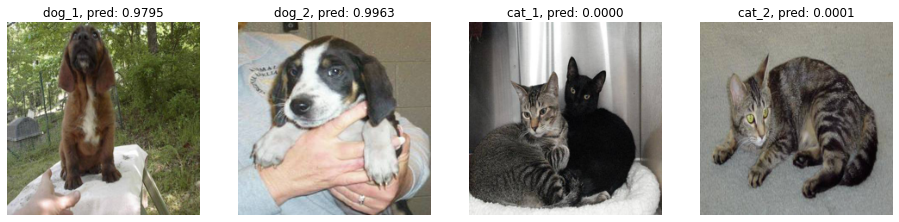

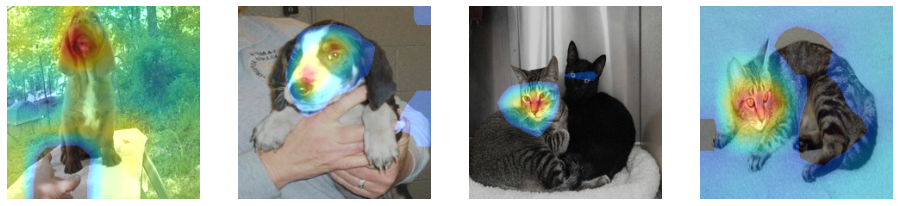

In [144]:
show_images(original_images, preidct_original, convert_names)

grad_cam(get_model, original_images)

## Pixel Update(add, sub)

#### add pixel

In [0]:
convert_names = ['addpixel_1', 'addpixel_5', 'addpixel_10', 'addpixel_25', 'addpixel_50', 'addpixel_100']

In [0]:
#dog
dog_1_add = noisy("addpixel", dog_1)
dog_2_add = noisy("addpixel", dog_2)

#cat
cat_1_add = noisy("addpixel", cat_1)
cat_2_add = noisy("addpixel", cat_2)

In [0]:
#expand dims images

#dog
dog_1_add = expand_dims(dog_1_add); dog_2_add = expand_dims(dog_2_add)

#cat
cat_1_add = expand_dims(cat_1_add); cat_2_add = expand_dims(cat_2_add)

#model predict images
#dog
predict_1_dog = model_predict(dog_1_add, get_model); predict_2_dog = model_predict(dog_2_add, get_model)

#cat
predict_1_cat = model_predict(cat_1_add, get_model); predict_2_cat = model_predict(cat_2_add, get_model)

#squeeze dims images
#dog
dog_1_add = squeeze_dims(dog_1_add); dog_2_add = squeeze_dims(dog_2_add)

#cat
cat_1_add = squeeze_dims(cat_1_add); cat_2_add = squeeze_dims(cat_2_add)

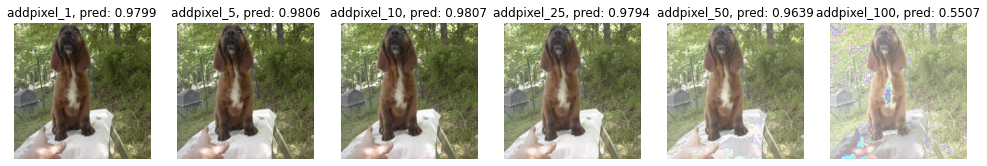

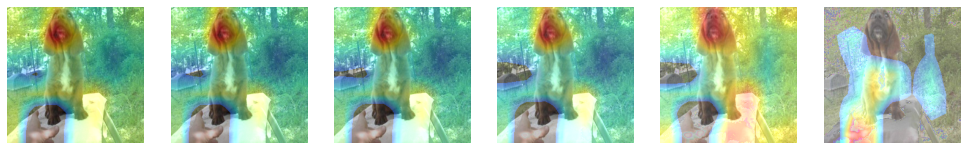

In [50]:
show_images(dog_1_add, predict_1_dog, convert_names)

grad_cam(get_model, dog_1_add)

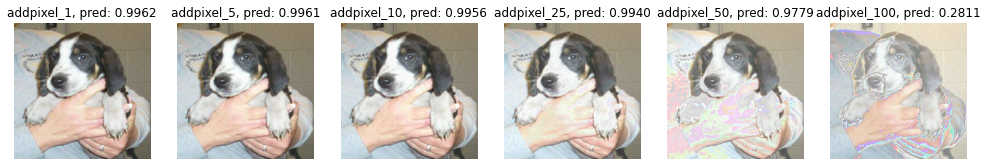

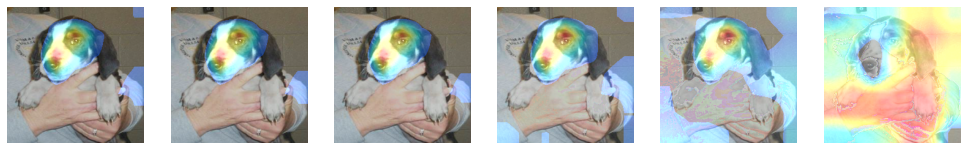

In [51]:
show_images(dog_2_add, predict_2_dog, convert_names)

grad_cam(get_model, dog_2_add)

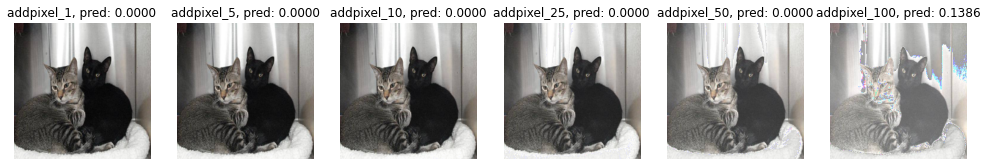

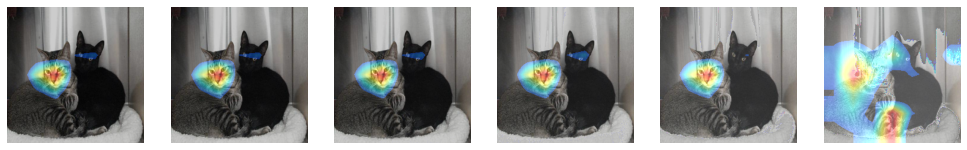

In [52]:
show_images(cat_1_add, predict_1_cat, convert_names)

grad_cam(get_model, cat_1_add)

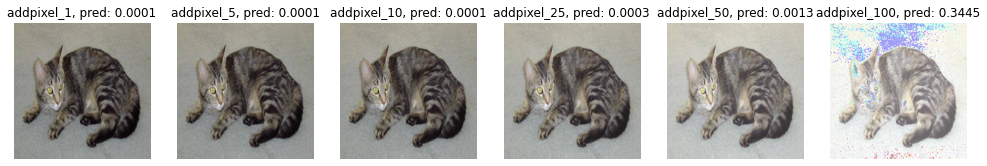

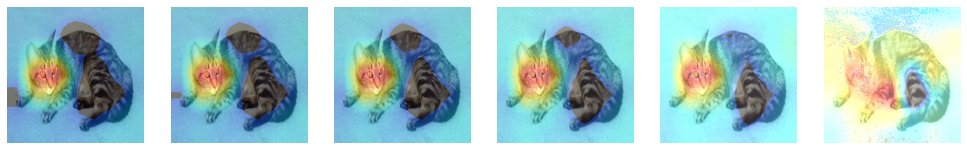

In [53]:
show_images(cat_2_add, predict_2_cat, convert_names)

grad_cam(get_model, cat_2_add)

## sub pixel

In [0]:
convert_names = ['subpixel_1', 'subpixel_5', 'subpixel_10', 'subpixel_25', 'subpixel_50', 'subpixel_100']

In [0]:
#dog
dog_1_sub = noisy("subpixel", dog_1)
dog_2_sub = noisy("subpixel", dog_2)

#cat
cat_1_sub = noisy("subpixel", cat_1)
cat_2_sub = noisy("subpixel", cat_2)

In [0]:
#expand dims images

#dog
dog_1_sub = expand_dims(dog_1_sub); dog_2_sub = expand_dims(dog_2_sub)

#cat
cat_1_sub = expand_dims(cat_1_sub); cat_2_sub = expand_dims(cat_2_sub)

#model predict images
#dog
predict_1_dog = model_predict(dog_1_sub, get_model); predict_2_dog = model_predict(dog_2_sub, get_model)

#cat
predict_1_cat = model_predict(cat_1_sub, get_model); predict_2_cat = model_predict(cat_2_sub, get_model)

#squeeze dims images
#dog
dog_1_sub = squeeze_dims(dog_1_sub); dog_2_sub = squeeze_dims(dog_2_sub)

#cat
cat_1_sub = squeeze_dims(cat_1_sub); cat_2_sub = squeeze_dims(cat_2_sub)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


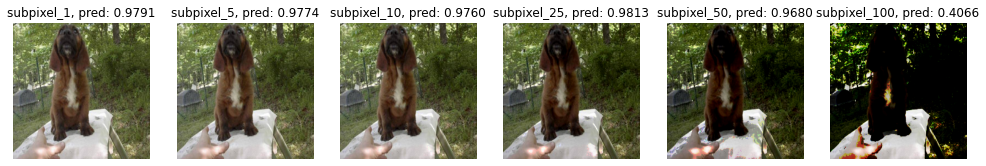

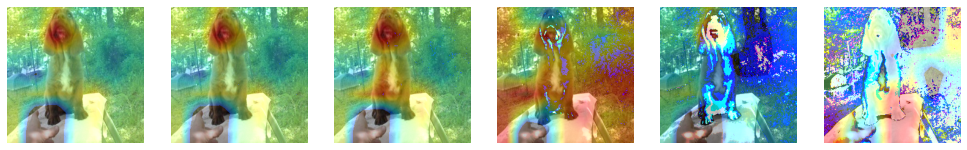

In [57]:
show_images(dog_1_sub, predict_1_dog, convert_names)

grad_cam(get_model, dog_1_sub)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


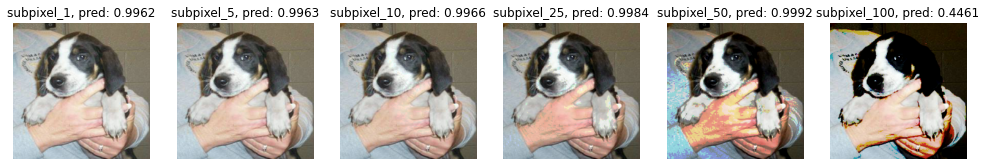

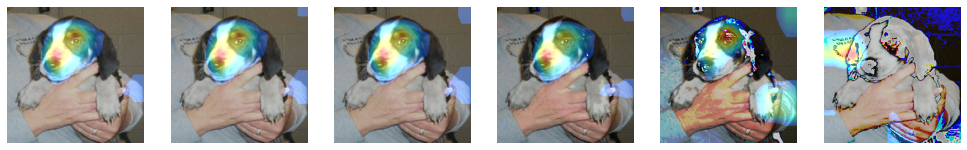

In [58]:
show_images(dog_2_sub, predict_2_dog, convert_names)

grad_cam(get_model, dog_2_sub)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


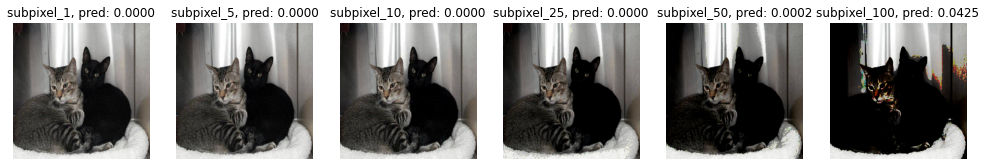

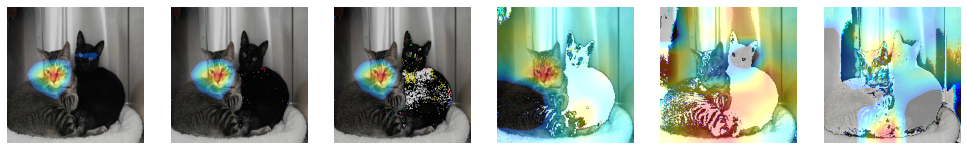

In [59]:
show_images(cat_1_sub, predict_1_cat, convert_names)

grad_cam(get_model, cat_1_sub)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


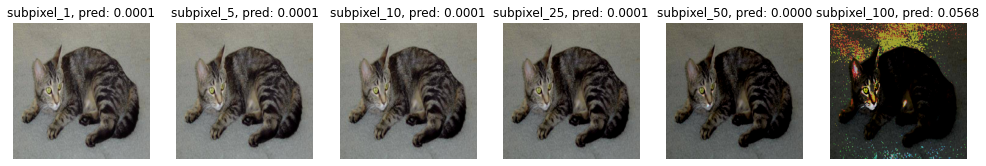

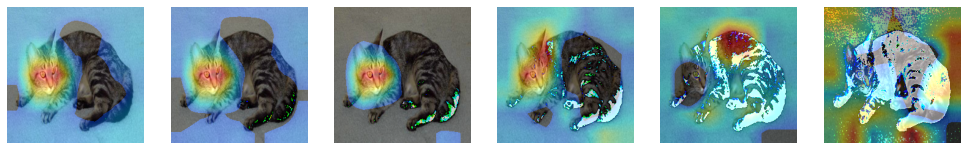

In [60]:
show_images(cat_2_sub, predict_2_cat, convert_names)

grad_cam(get_model, cat_2_sub)

## add a line

In [0]:
convert_names = ['addline_0.1', 'addline_0.3', 'addline_0.5', 'addline_0.7', 'addline_0.9']

In [0]:
#dog
dog_1_line = noisy("line", dog_1)
dog_2_line = noisy("line", dog_2)

#cat
cat_1_line = noisy("line", cat_1)
cat_2_line = noisy("line", cat_2)

In [0]:
#expand dims images

#dog
dog_1_line = expand_dims(dog_1_line); dog_2_line = expand_dims(dog_2_line)

#cat
cat_1_line = expand_dims(cat_1_line); cat_2_line = expand_dims(cat_2_line)

#model predict images
#dog
predict_1_dog = model_predict(dog_1_line, get_model); predict_2_dog = model_predict(dog_2_line, get_model)

#cat
predict_1_cat = model_predict(cat_1_line, get_model); predict_2_cat = model_predict(cat_2_line, get_model)

#squeeze dims images
#dog
dog_1_line = squeeze_dims(dog_1_line); dog_2_line = squeeze_dims(dog_2_line)

#cat
cat_1_line = squeeze_dims(cat_1_line); cat_2_line = squeeze_dims(cat_2_line)

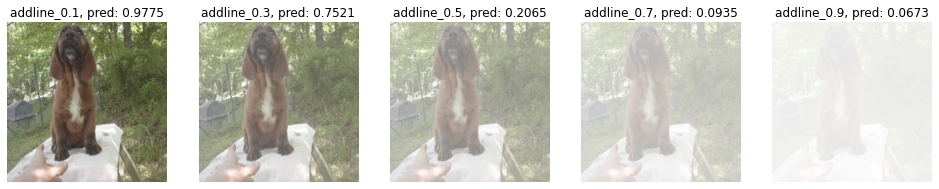

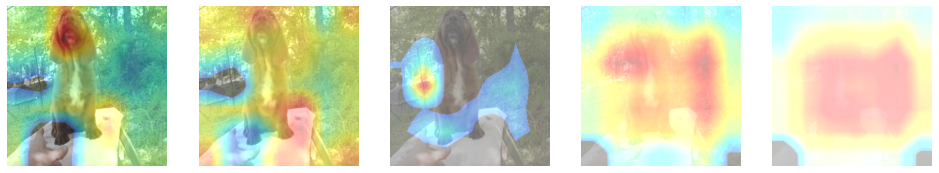

In [64]:
show_images(dog_1_line, predict_1_dog, convert_names)

grad_cam(get_model, dog_1_line)

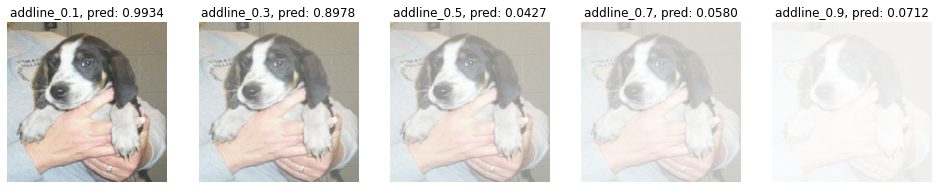

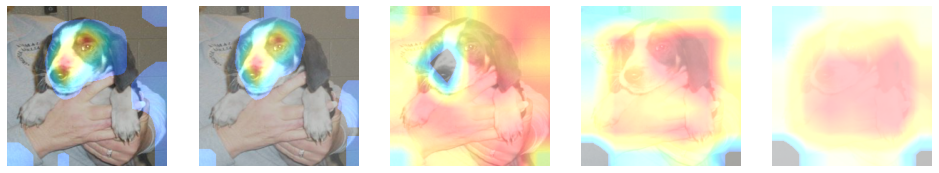

In [65]:
show_images(dog_2_line, predict_2_dog, convert_names)

grad_cam(get_model, dog_2_line)

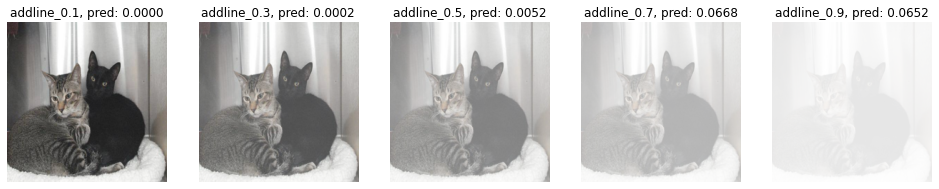

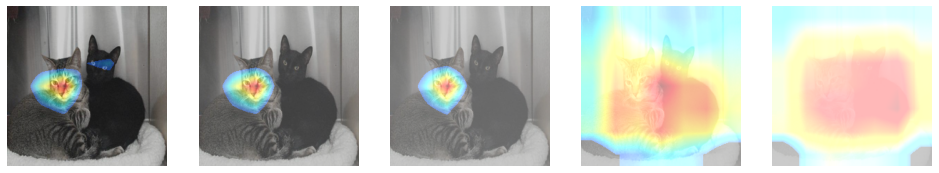

In [66]:
show_images(cat_1_line, predict_1_cat, convert_names)

grad_cam(get_model, cat_1_line)

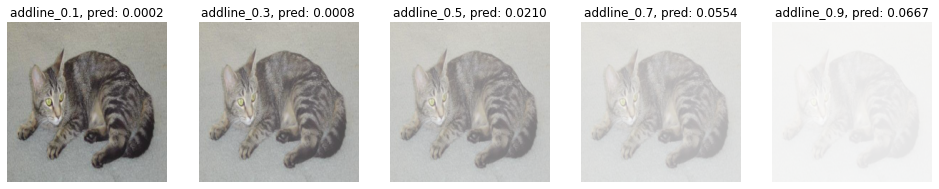

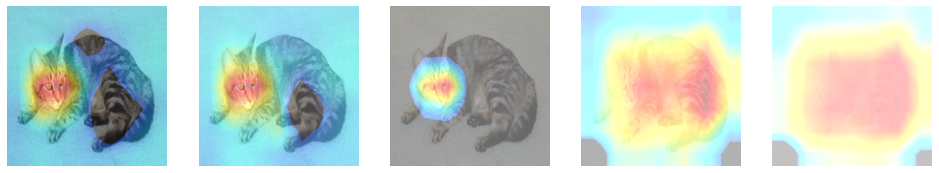

In [67]:
show_images(cat_2_line, predict_2_cat, convert_names)

grad_cam(get_model, cat_2_line)

## Gauss

In [0]:
convert_names = ['addsigma_0.1', 'addsigma_0.3', 'addsigma_0.5', 'addsigma_0.7', 'addsigma_0.9']

In [0]:
#dog
dog_1_gauss = noisy("gauss", dog_1)
dog_2_gauss = noisy("gauss", dog_2)

#cat
cat_1_gauss = noisy("gauss", cat_1)
cat_2_gauss = noisy("gauss", cat_2)

In [0]:
#expand dims images

#dog
dog_1_gauss = expand_dims(dog_1_gauss); dog_2_gauss = expand_dims(dog_2_gauss)

#cat
cat_1_gauss = expand_dims(cat_1_gauss); cat_2_gauss = expand_dims(cat_2_gauss)

#model predict images
#dog
predict_1_dog = model_predict(dog_1_gauss, get_model); predict_2_dog = model_predict(dog_2_gauss, get_model)

#cat
predict_1_cat = model_predict(cat_1_gauss, get_model); predict_2_cat = model_predict(cat_2_gauss, get_model)

#squeeze dims images
#dog
dog_1_gauss = squeeze_dims(dog_1_gauss); dog_2_gauss = squeeze_dims(dog_2_gauss)

#cat
cat_1_gauss = squeeze_dims(cat_1_gauss); cat_2_gauss = squeeze_dims(cat_2_gauss)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


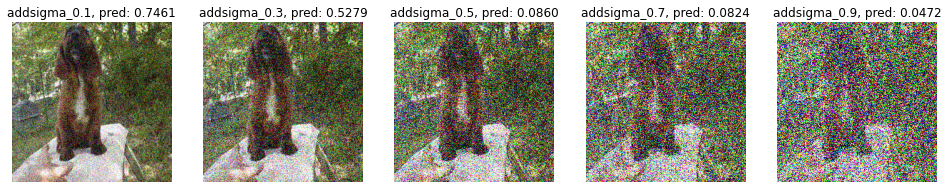

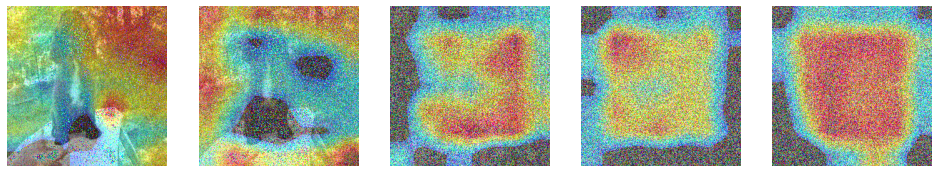

In [71]:
show_images(dog_1_gauss, predict_1_dog, convert_names)

grad_cam(get_model, dog_1_gauss)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


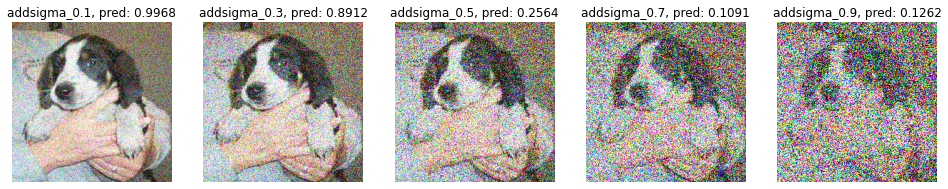

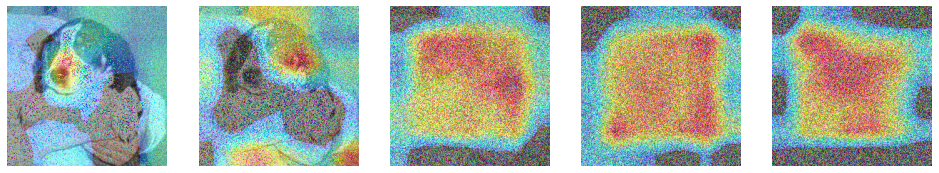

In [72]:
show_images(dog_2_gauss, predict_2_dog, convert_names)

grad_cam(get_model, dog_2_gauss)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


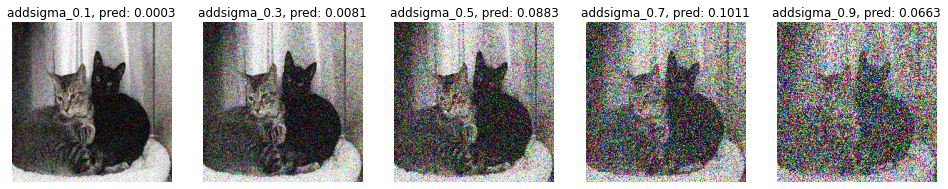

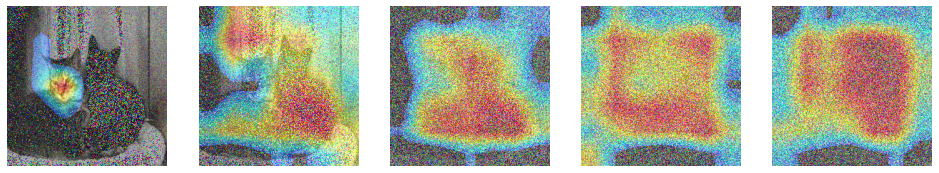

In [73]:
show_images(cat_1_gauss, predict_1_cat, convert_names)

grad_cam(get_model, cat_1_gauss)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


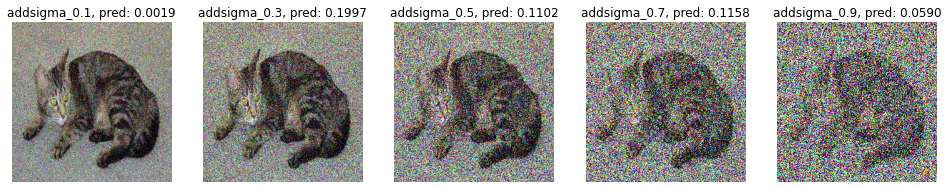

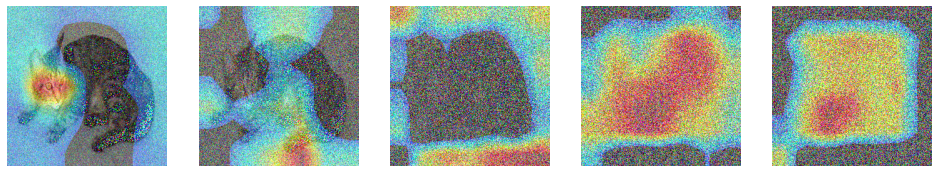

In [74]:
show_images(cat_2_gauss, predict_2_cat, convert_names)

grad_cam(get_model, cat_2_gauss)

## Salt & Pepper

In [0]:
convert_names = ['addamount0.01', 'addamount0.03', 'addamount0.05', 'addamount0.07', 'addamount0.09']

In [76]:
#dog
dog_1_sp = noisy("s&p", dog_1)
dog_2_sp = noisy("s&p", dog_2)

#cat
cat_1_sp = noisy("s&p", cat_1)
cat_2_sp = noisy("s&p", cat_2)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:67: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:73: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


In [0]:
#expand dims images

#dog
dog_1_sp = expand_dims(dog_1_sp); dog_2_sp = expand_dims(dog_2_sp)

#cat
cat_1_sp = expand_dims(cat_1_sp); cat_2_sp = expand_dims(cat_2_sp)

#model predict images
#dog
predict_1_dog = model_predict(dog_1_sp, get_model); predict_2_dog = model_predict(dog_2_sp, get_model)

#cat
predict_1_cat = model_predict(cat_1_sp, get_model); predict_2_cat = model_predict(cat_2_sp, get_model)

#squeeze dims images
#dog
dog_1_sp = squeeze_dims(dog_1_sp); dog_2_sp = squeeze_dims(dog_2_sp)

#cat
cat_1_sp = squeeze_dims(cat_1_sp); cat_2_sp = squeeze_dims(cat_2_sp)

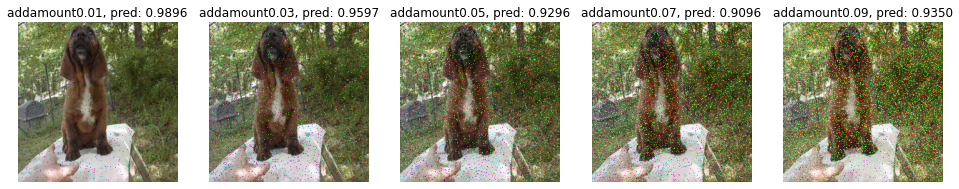

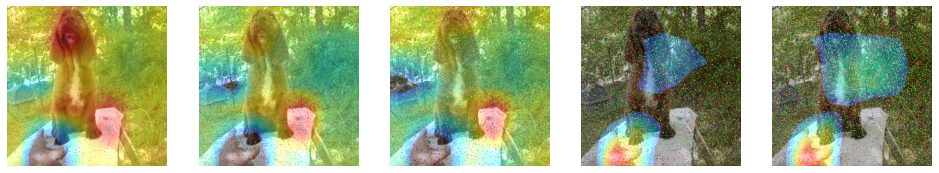

In [78]:
show_images(dog_1_sp, predict_1_dog, convert_names)

grad_cam(get_model, dog_1_sp)

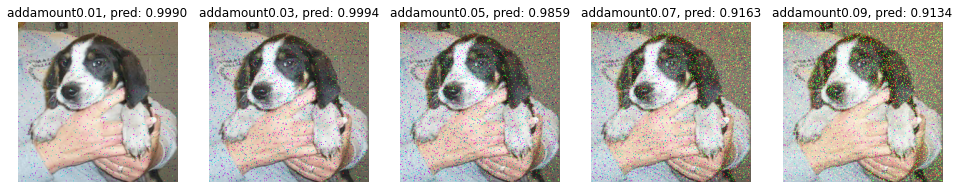

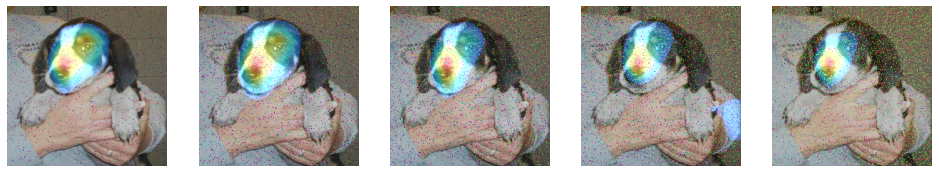

In [79]:
show_images(dog_2_sp, predict_2_dog, convert_names)

grad_cam(get_model, dog_2_sp)

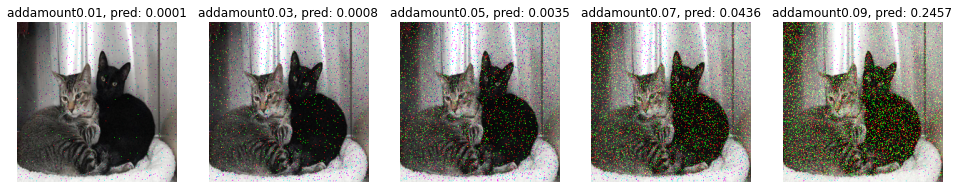

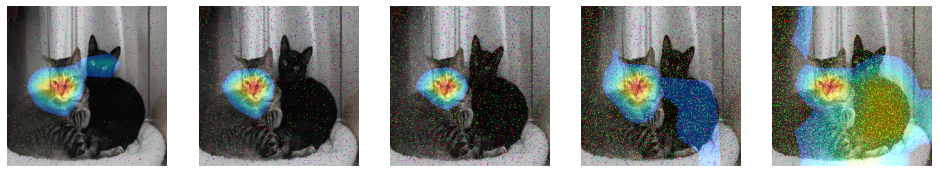

In [80]:
show_images(cat_1_sp, predict_1_cat, convert_names)

grad_cam(get_model, cat_1_sp)

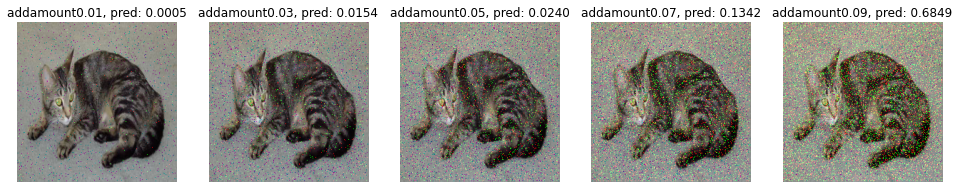

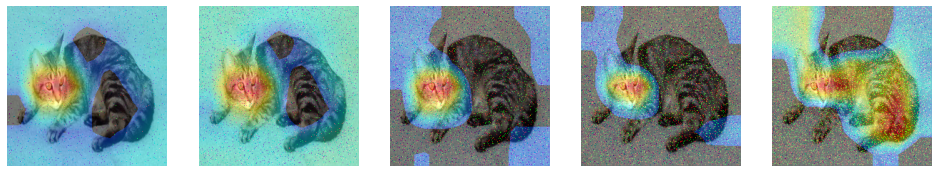

In [81]:
show_images(cat_2_sp, predict_2_cat, convert_names)

grad_cam(get_model, cat_2_sp)

## poisson

In [0]:
convert_names = ['possion_2', 'possion_4', 'possion_6', 'possion_8', 'possion_10']

In [0]:
#dog
dog_1_poisson = noisy("poisson", dog_1)
dog_2_poisson = noisy("poisson", dog_2)

#cat
cat_1_poisson = noisy("poisson", cat_1)
cat_2_poisson = noisy("poisson", cat_2)

In [0]:
#expand dims images

#dog
dog_1_poisson = expand_dims(dog_1_poisson); dog_2_poisson = expand_dims(dog_2_poisson)

#cat
cat_1_poisson = expand_dims(cat_1_poisson); cat_2_poisson = expand_dims(cat_2_poisson)

#model predict images
#dog
predict_1_dog = model_predict(dog_1_poisson, get_model); predict_2_dog = model_predict(dog_2_poisson, get_model)

#cat
predict_1_cat = model_predict(cat_1_poisson, get_model); predict_2_cat = model_predict(cat_2_poisson, get_model)

#squeeze dims images
#dog
dog_1_poisson = squeeze_dims(dog_1_poisson); dog_2_poisson = squeeze_dims(dog_2_poisson)

#cat
cat_1_poisson = squeeze_dims(cat_1_poisson); cat_2_poisson = squeeze_dims(cat_2_poisson)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


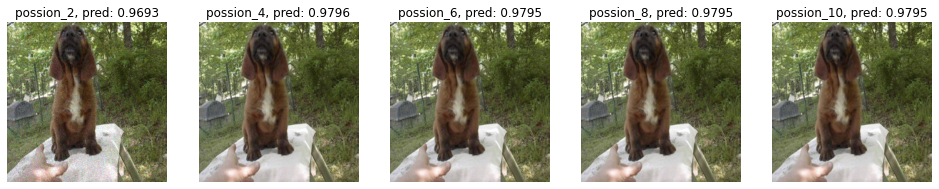

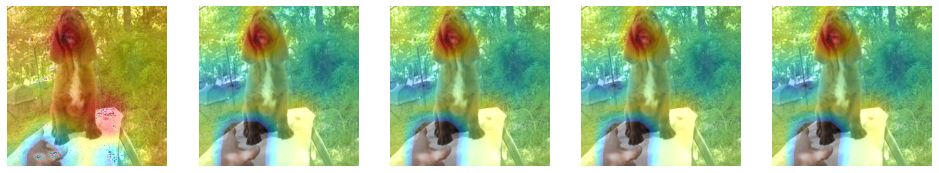

In [85]:
show_images(dog_1_poisson, predict_1_dog, convert_names)

grad_cam(get_model, dog_1_poisson)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


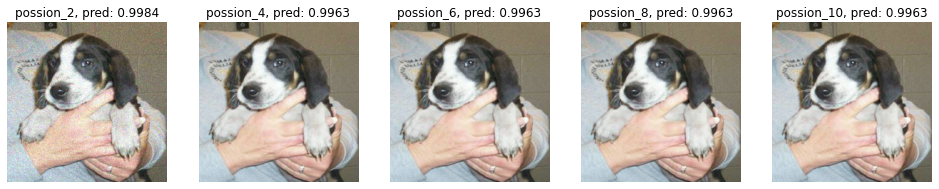

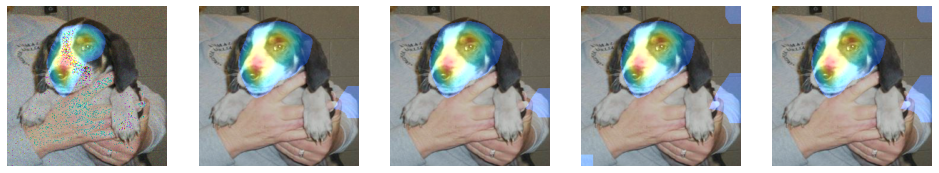

In [86]:
show_images(dog_2_poisson, predict_2_dog, convert_names)

grad_cam(get_model, dog_2_poisson)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


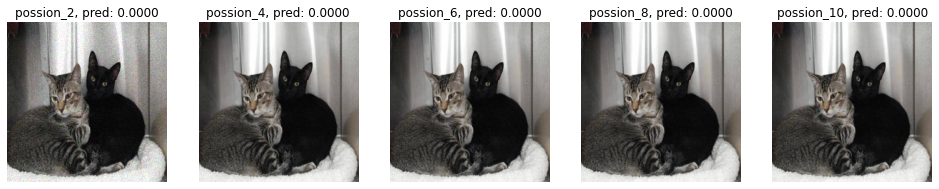

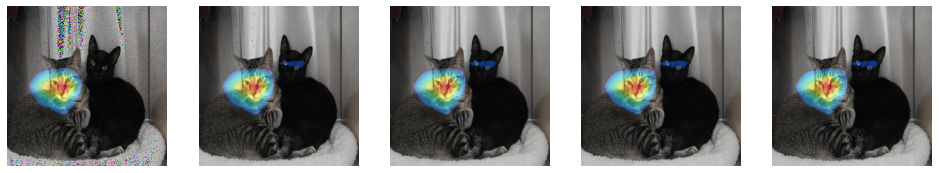

In [87]:
show_images(cat_1_poisson, predict_1_cat, convert_names)

grad_cam(get_model, cat_1_poisson)

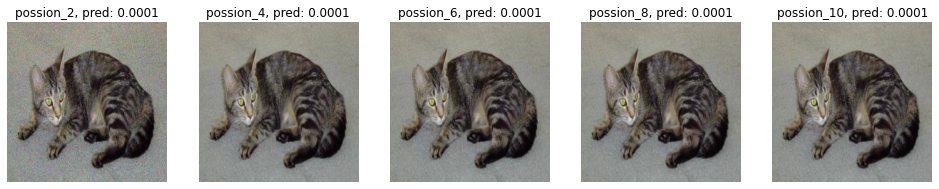

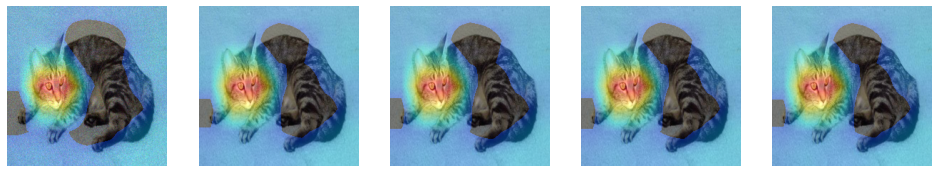

In [88]:
show_images(cat_2_poisson, predict_2_cat, convert_names)

grad_cam(get_model, cat_2_poisson)

## speckle

In [0]:
convert_names = ['speckle', 'speckle', 'speckle', 'speckle']

In [0]:
#dog
dog_1_speckle = noisy("speckle", dog_1)
dog_2_speckle = noisy("speckle", dog_2)

#cat
cat_1_speckle = noisy("speckle", cat_1)
cat_2_speckle = noisy("speckle", cat_2)

In [0]:
speckle_list = [dog_1_speckle, dog_2_speckle, cat_1_speckle, cat_2_speckle]

In [0]:
speckle_list = expand_dims(speckle_list)

preidct_speckle = model_predict(speckle_list, get_model)

speckle_list = squeeze_dims(speckle_list)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


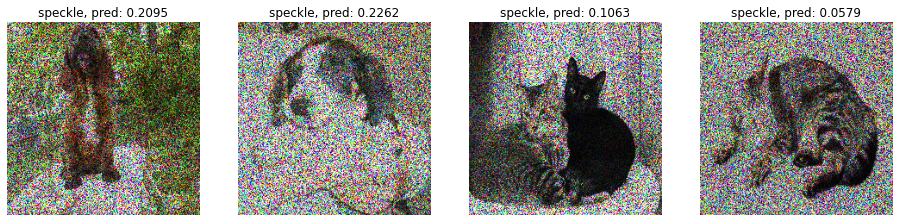

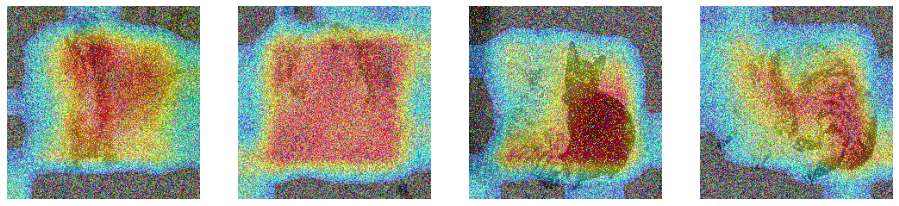

In [93]:
show_images(speckle_list, preidct_speckle, convert_names)

grad_cam(get_model, speckle_list)

##Cellphone(galaxy 9+, iphon6, gpro)

In [0]:
gpro_dog = Image.open('/content/gdrive/My Drive/dataset/data_aug/data_aug/cellphone/gpro_dog.jpg').resize((224, 224))
gpro_dog = np.array(gpro_dog)
gpro_dog = gpro_dog / 255.0

iphone6_dog = Image.open('/content/gdrive/My Drive/dataset/data_aug/data_aug/cellphone/iphone6_dog.jpg').resize((224, 224))
iphone6_dog = np.array(iphone6_dog)
iphone6_dog = iphone6_dog / 255.0

galaxys9cpp_dog = Image.open('/content/gdrive/My Drive/dataset/data_aug/data_aug/cellphone/galaxys9cpp_dog.jpg').resize((224, 224))
galaxys9cpp_dog = np.array(galaxys9cpp_dog)
galaxys9cpp_dog = galaxys9cpp_dog / 255.0

In [0]:
convert_names = ['galaxy 9+', 'iphon6', 'gpro']
cellphone_list = [gpro_dog, iphone6_dog, galaxys9cpp_dog]

In [0]:
cellphone_list = expand_dims(cellphone_list)

preidct_dsp = model_predict(cellphone_list, get_model)

cellphone_list = squeeze_dims(cellphone_list)

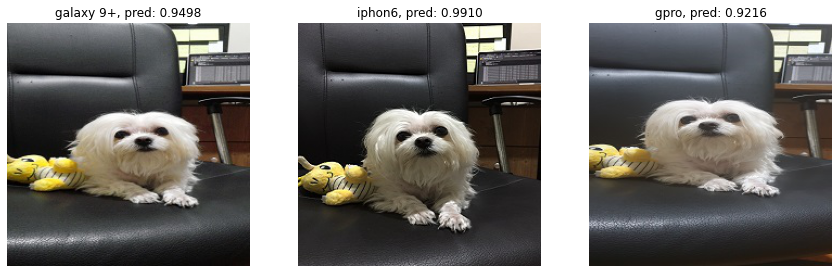

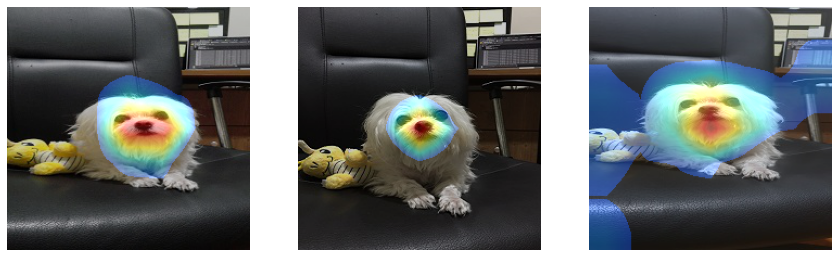

In [98]:
show_images(cellphone_list, preidct_dsp, convert_names)

grad_cam(get_model, cellphone_list)

## 데이터 포맷(jpg, png, bmp, tiff)
원본 파일에 포맷 확장자만 다르게 설정하여 확인한 결과 변함이 없음.

In [0]:
png_path = Image.open('/content/gdrive/My Drive/dataset/data_aug/png/dog.4.png').resize((224, 224))
png_img = np.array(png_path)
png_img = png_img / 255.0

jpg_path = Image.open('/content/gdrive/My Drive/dataset/test/dog/dog.4.jpg').resize((224, 224))
jpg_img = np.array(jpg_path)
jpg_img = jpg_img / 255.0

bmp_path = Image.open('/content/gdrive/My Drive/dataset/data_aug/bmp/dog.4.bmp').resize((224, 224))
bmp_img = np.array(bmp_path)
bmp_img = bmp_img / 255.0

tiff_path = Image.open('/content/gdrive/My Drive/dataset/data_aug/tiff/dog.4.tiff').resize((224, 224))
tiff_img = np.array(tiff_path)
tiff_img = tiff_img / 255.0

In [0]:
convert_names = ['png', 'jpg', 'bmp', 'tiff']

format_list = [png_img, jpg_img, bmp_img, tiff_img]

In [0]:
format_list = expand_dims(format_list)

preidct_format = model_predict(format_list, get_model)

format_list = squeeze_dims(format_list)

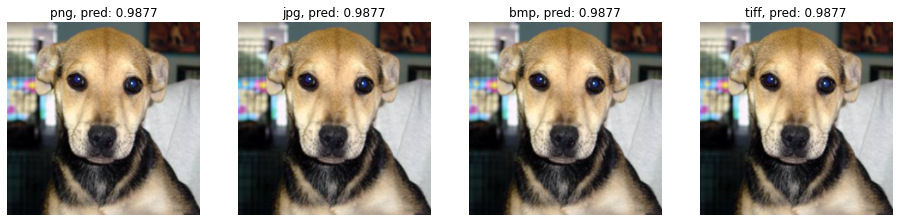

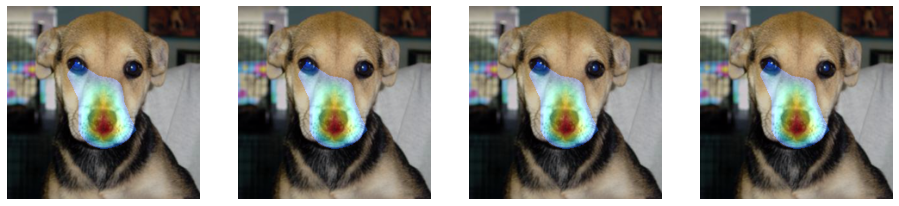

In [179]:
show_images(format_list, preidct_format, convert_names)

grad_cam(get_model, format_list)